# Exploratory Data Analysis and Network Analysis

In [2]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from collections import Counter
from joblib import load, dump
from ipywidgets import widgets
import plotly.graph_objects as go
import plotly.express as px
from dash import html, dcc
from dash.dependencies import Input, Output
import matplotlib.gridspec as gridspec
import seaborn as sns
import pandas as pd
import numpy as np
import networkx as nx
import pyLDAvis
import dash
import string
import time
import os
import re

The dataframes imported from the previous notebook consist of a document topic distribution with each document being one 5000-word segment of a book and features about the texts covering the following attributes: 'title', 'author', 'date','gender', 'birthdate', 'nationality', 'source' always being given, as well as the following only filled for about 1/4 of the texts 'period', 'mode', 'genre', 'role' and 'polarity', 

Additionally a number of features relevant for th topic explorations offered by pyLDAvis are imported as well.

In [3]:
df_txt_features_LDA=pd.read_csv('./analysis/df_txt_features_LDA.csv')
df_txt_features_CTM=pd.read_csv('./analysis/df_txt_features_CTM.csv')
df_txt_features_ETM=pd.read_csv('./analysis/df_txt_features_ETM.csv')

In [4]:
top_words_per_topic_LDA = ('./analysis/top_words_per_topic_LDA.joblib')
top_words_per_topic_CTM = ('./analysis/top_words_per_topic_CTM.joblib')
top_words_per_topic_ETM = ('./analysis/top_words_per_topic_ETM.joblib')

In [5]:
topic_term_dists_LDA = load('./analysis/topic_term_dists_LDA.joblib')
doc_topic_dists_LDA = load('./analysis/doc_topic_dists_LDA.joblib')
topic_term_dists_CTM = load('./analysis/topic_term_dists_CTM.joblib')
doc_topic_dists_CTM = load('./analysis/doc_topic_dists_CTM.joblib')
topic_term_dists_ETM = load('./analysis/topic_term_dists_ETM.joblib')
doc_topic_dists_ETM = load('./analysis/doc_topic_dists_ETM.joblib')
vocab = load('./analysis/vocab.joblib')
doc_lengths= load('./analysis/doc_lengths.joblib')
term_frequency = load('./analysis/term_frequency.joblib')

## LDA

This section is the current main branch of analysis and development, while any changes in the CTM or ETA shall only be mirrors, even if the evaluation stands on its own.

pyLDAvis offers an intuitive method for exploring the most important words for ach topic, the weight they carry within it and the relationship and distance between the given topics. For this multidimensional scaling reduces the topic term distribution to a two dimensional space, retaining both the importance of a given topic within the corpus, as well as their distance to one another with the help of Jensen-Shannon Divergence as its metric. A common approach for multi dimesnional scaling.

In [6]:
prepared_data = pyLDAvis.prepare(topic_term_dists_LDA, doc_topic_dists_LDA, doc_lengths, vocab, term_frequency)

pyLDAvis.display(prepared_data)

#### Exploring the feature distribution of the corpus in general

In [6]:
df_feat = df_txt_features_LDA.copy()
df_feat.fillna({'period': 'Unknown', 'mode': 'Unknown', 'genre': 'Unknown', 'role': 'Unknown'}, inplace=True)

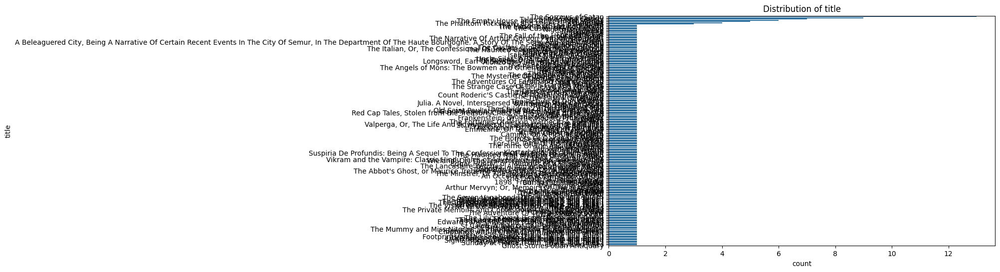

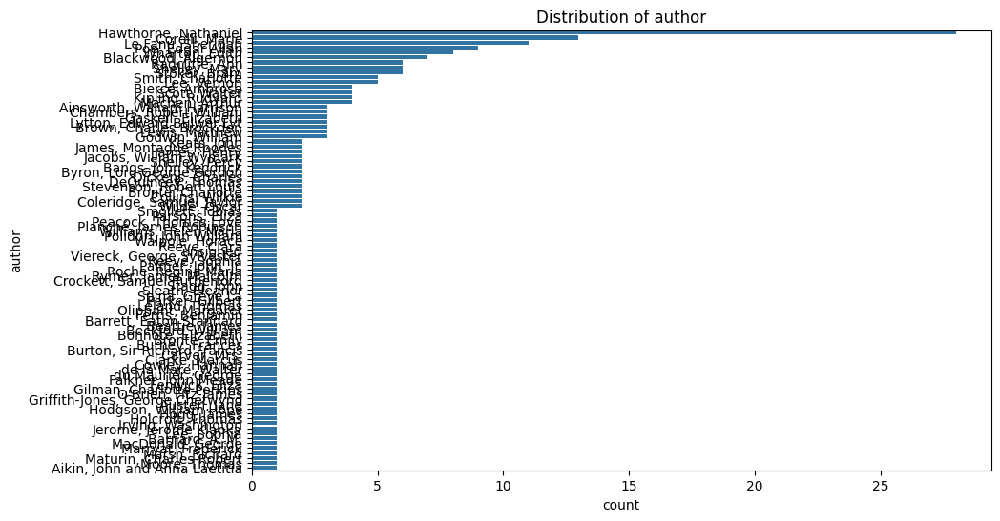

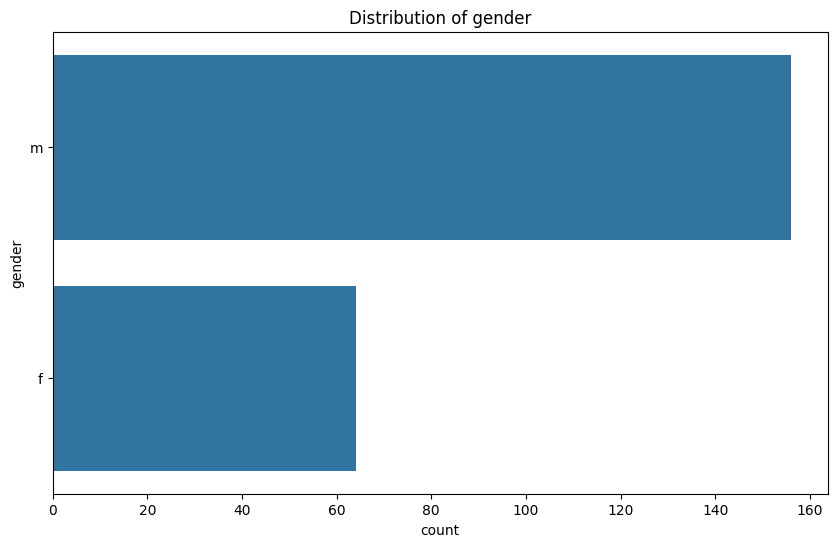

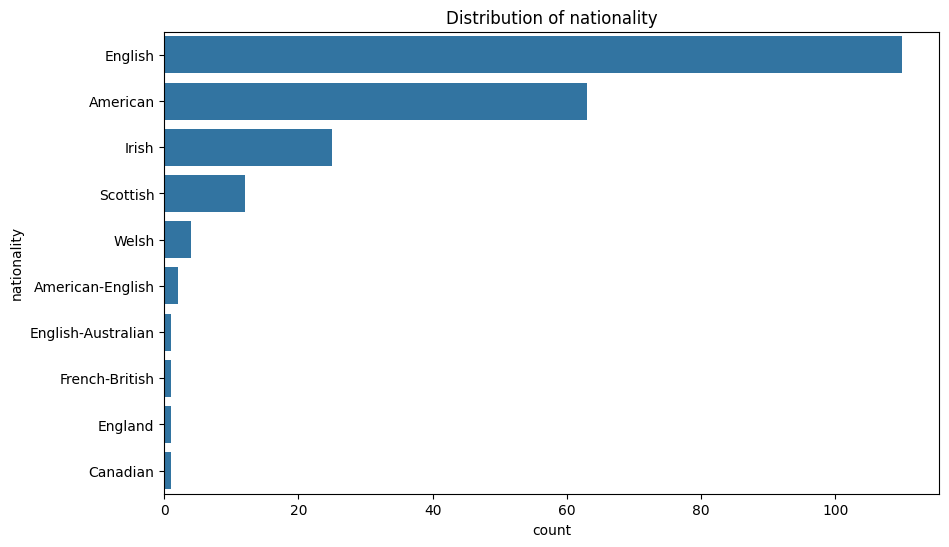

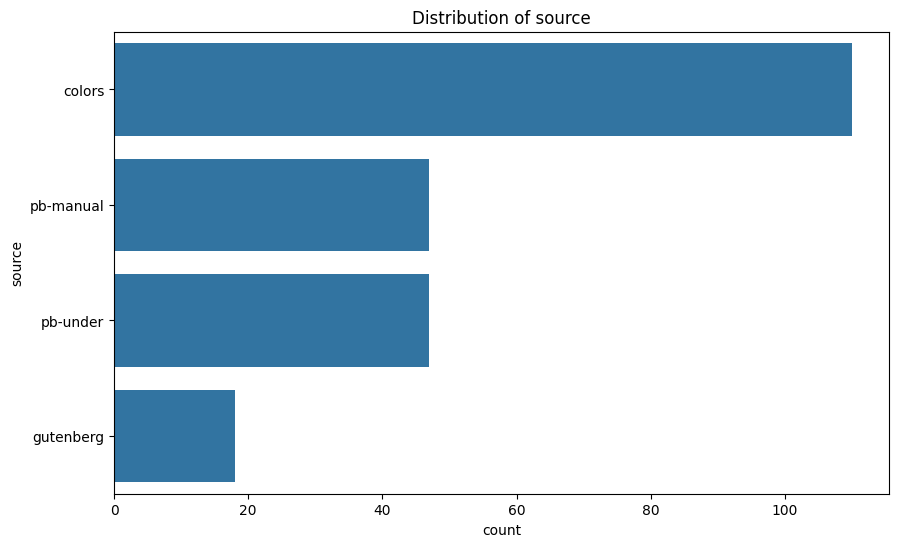

...

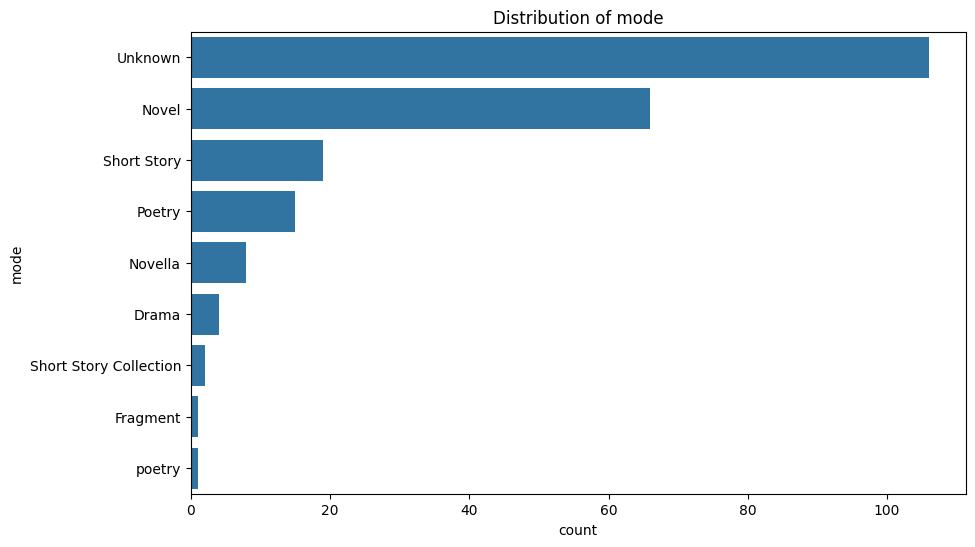

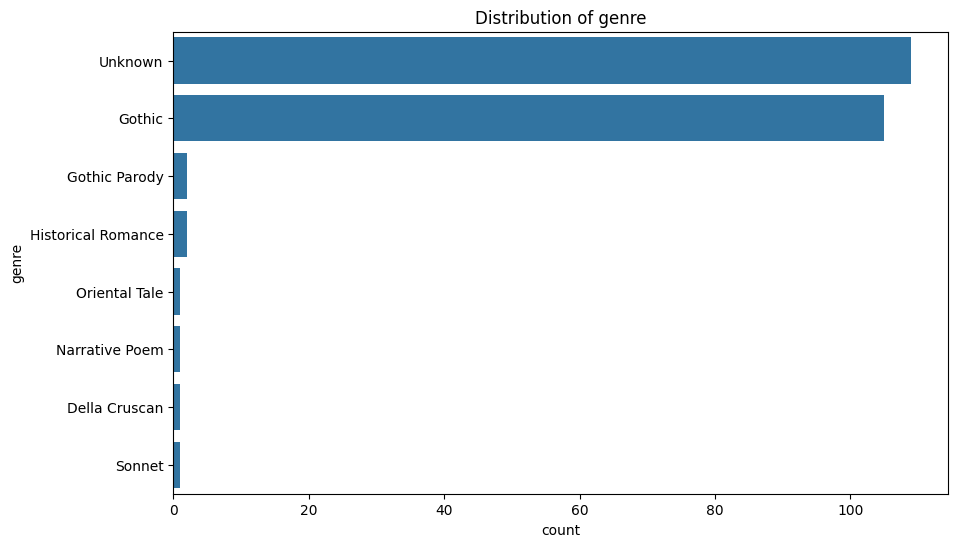

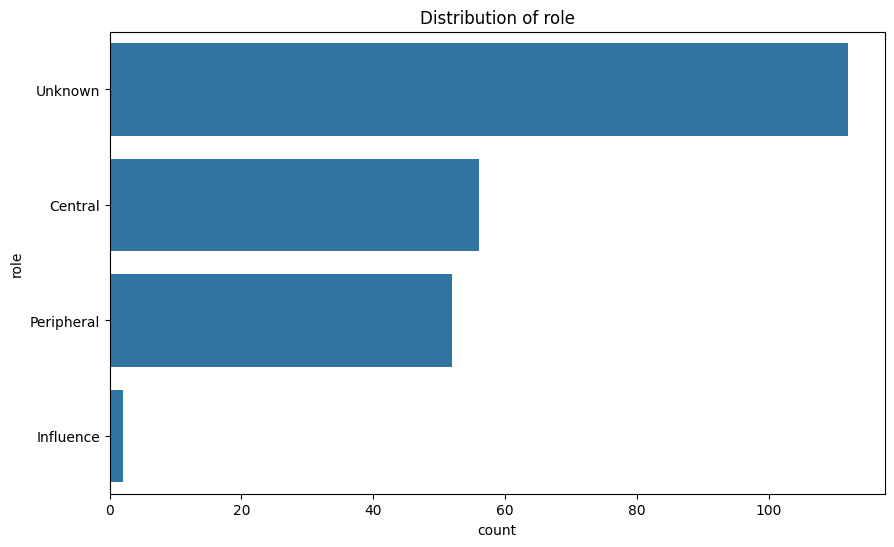

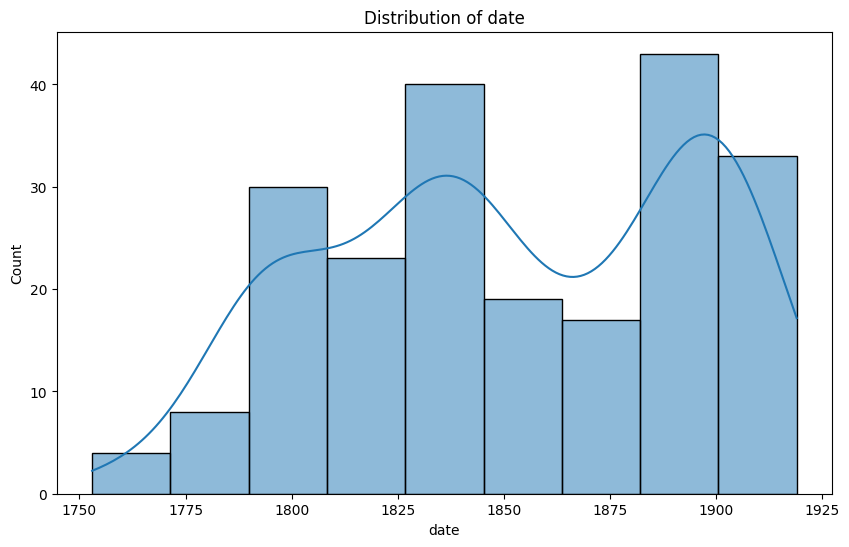

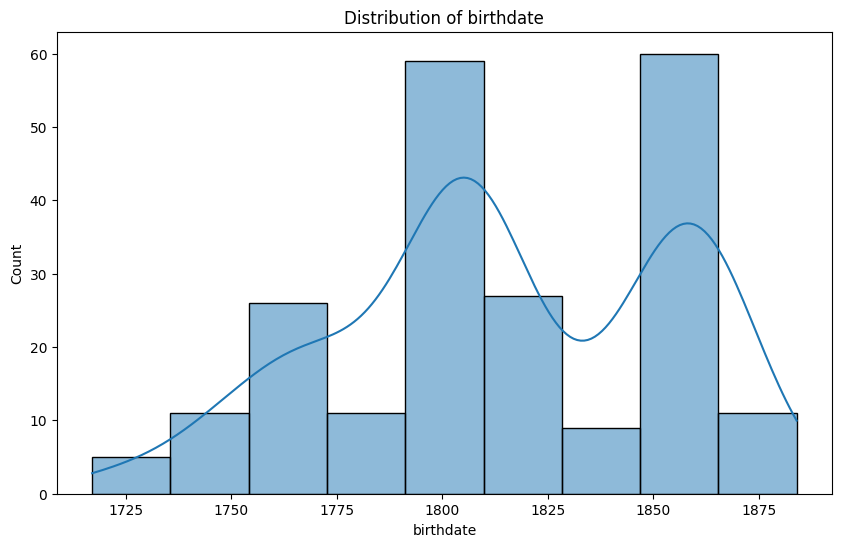

In [41]:
# Categorical features
categorical_features = ['title', 'author', 'gender', 'nationality', 'source', 'period', 'mode', 'genre', 'role']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    # Ordering the categories by frequency
    order = df_feat[feature].value_counts().index
    sns.countplot(y=feature, data=df_feat, order=order)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Numerical features
numerical_features = ['date', 'birthdate']
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_feat[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

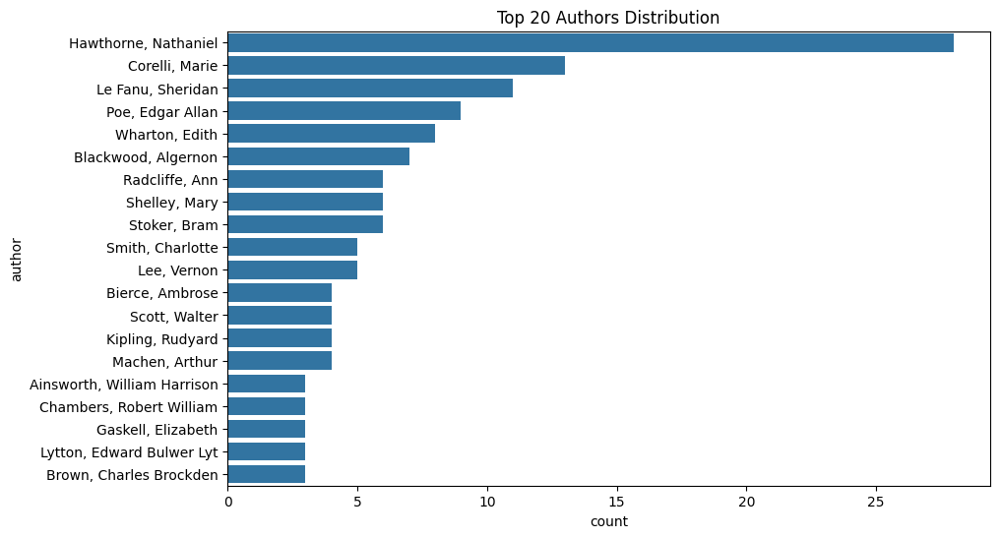

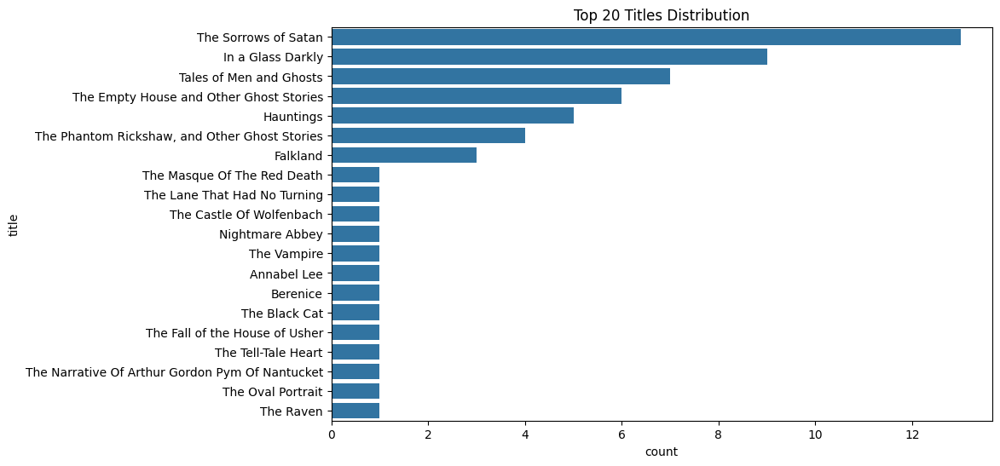

In [43]:
# Adjusting distributions for 'name' and 'title' - focusing on the upper end and bending part of the distribution

top_authors = df_feat['author'].value_counts().nlargest(20).index
top_titles = df_feat['title'].value_counts().nlargest(20).index

# Plotting distributions for 'author'
plt.figure(figsize=(10, 6))
author_order = df_feat['author'].value_counts().iloc[:20].index
sns.countplot(y='author', data=df_feat, order=author_order)
plt.title('Top 20 Authors Distribution')
plt.show()

# Plotting distributions for 'title'
plt.figure(figsize=(10, 6))
title_order = df_feat['title'].value_counts().iloc[:20].index
sns.countplot(y='title', data=df_feat, order=title_order)
plt.title('Top 20 Titles Distribution')
plt.show()

#### Topic trends over time

In [44]:
df_time = df_txt_features_LDA.copy()

In [45]:
topic_columns = [col for col in df_time.columns if col.startswith('Topic')]

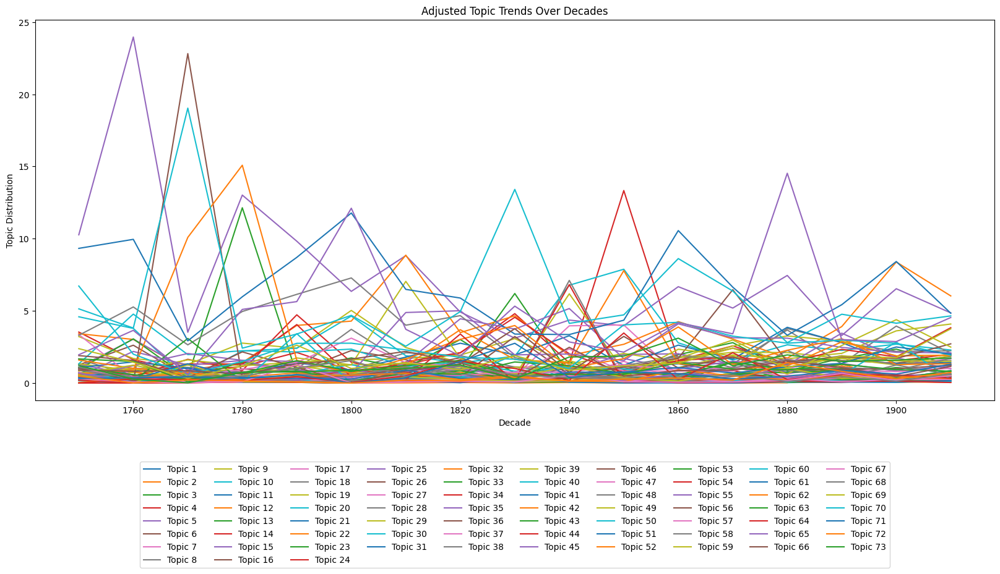

In [47]:
# Function to convert year to decade
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_time['decade'] = df_time['date'].apply(year_to_decade)

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped = df_time.groupby('decade')[topic_columns].mean()

plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in topic_columns:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

Those topics that surpass a certain threshhold of importance through out their life cycle.
- Filtering for maximal weight through out their lifetime.

In [49]:
# Group 1: Topics that never rise beyond a consistent level
consistent_topics = [topic for topic in topic_columns if decade_grouped[topic].max() <= 8]

# Group 2: Topics that fluctuate
peaking_topics = [topic for topic in topic_columns if decade_grouped[topic].max() > 8]

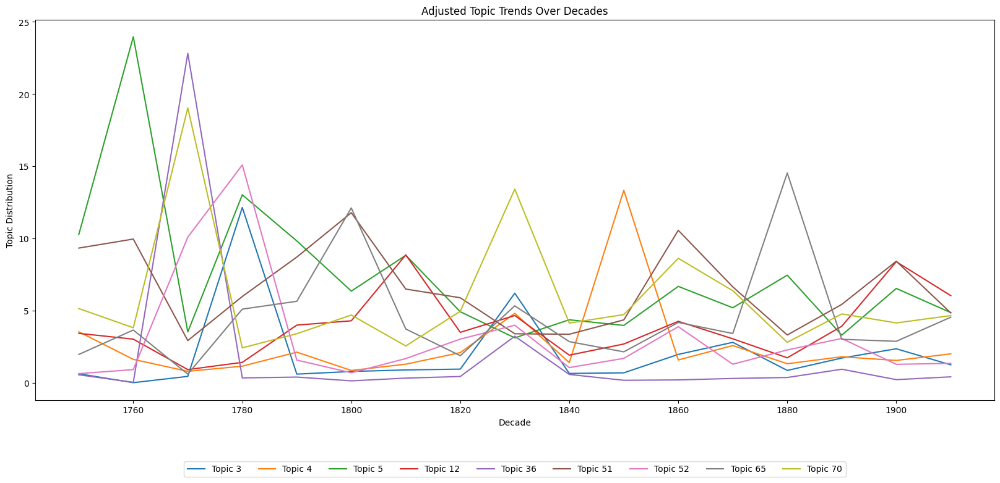

In [50]:
plt.figure(figsize=(20, 8)) 
for topic in peaking_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

Those topics that surpass a certain threshhold of fluctuation and carry a standard deviation higher than the 75th percentile across all topics, indicating that they do not maintain consistent values and vary significantly over the decades.

In [51]:
# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped.std()

# Setting a threshold for identifying strong fluctuations
percentile_threshold = np.percentile(topic_fluctuations, 90)

# Topics with fluctuations above the threshold
fluctuating_topics = topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

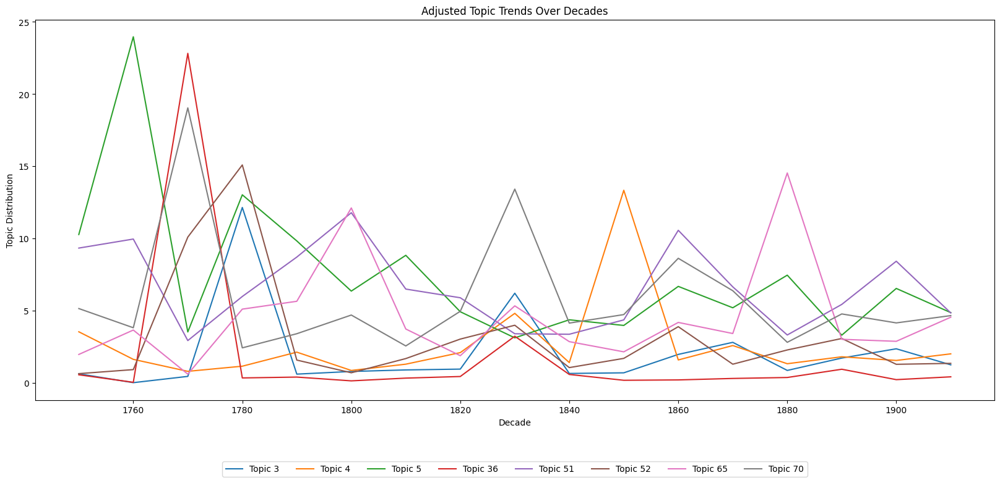

In [52]:
plt.figure(figsize=(20, 8)) 
for topic in fluctuating_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [9]:
#Now for a combination of the above in an interactive visualization

df_LDA = df_txt_features_LDA.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_LDA['decade'] = df_LDA['date'].apply(year_to_decade)

# Extracting topic columns
topic_columns_LDA = [col for col in df_LDA.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_LDA = df_LDA.groupby('decade')[topic_columns_LDA].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_LDA.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_LDA.index, y=decade_grouped_LDA[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig


# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_LDA.index, y=decade_grouped_LDA[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])


# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

#### Author-Specific Topic Analysis:

In [9]:
df = df_txt_features_LDA.copy()
topic_columns = [col for col in df.columns if col.startswith('Topic')]

In [139]:
# Finding the 20 most prevalent authors
top_authors = df['author'].value_counts().head(20).index.tolist()

# Finding authors with texts marked as 'central'
central_authors = df[df['role'] == 'Central']['author'].unique().tolist()

In [81]:
aggregated_topics_top_authors = pd.DataFrame(index=top_authors, columns=topic_columns)
for author in top_authors:
    aggregated_topics_top_authors.loc[author] = df[df['author'] == author][topic_columns].sum()
aggregated_topics_top_authors = aggregated_topics_top_authors.apply(pd.to_numeric)

# Identifying Top 5 Topics

# For Top Authors
top_5_topics_top_authors = pd.DataFrame(index=top_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in top_authors:
    top_topics = aggregated_topics_top_authors.loc[author].nlargest(5).index.tolist()
    top_5_topics_top_authors.loc[author] = top_topics
# Preparing data for visualization 

filtered_data_top_authors = pd.DataFrame(index=top_authors, columns=topic_columns)
for author in top_authors:
    top_topics = top_5_topics_top_authors.loc[author]
    filtered_data_top_authors.loc[author, top_topics] = aggregated_topics_top_authors.loc[author, top_topics]
filtered_data_top_authors.fillna(0, inplace=True)
filtered_data_top_authors = filtered_data_top_authors.apply(pd.to_numeric)

In [82]:
# Exclude central authors who are also in the list of top authors
refined_central_authors = [author for author in central_authors if author not in top_authors]

# Re-aggregate Topic Distribution for the refined list of central authors
aggregated_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    aggregated_topics_refined_central.loc[author] = df[df['author'] == author][topic_columns].sum()
aggregated_topics_refined_central = aggregated_topics_refined_central.apply(pd.to_numeric)

# Identifying Top 5 Topics for the central authors
top_5_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in refined_central_authors:
    top_topics = aggregated_topics_refined_central.loc[author].nlargest(5).index.tolist()
    top_5_topics_refined_central.loc[author] = top_topics

# Preparing data for visualization
filtered_data_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    top_topics = top_5_topics_refined_central.loc[author]
    filtered_data_refined_central.loc[author, top_topics] = aggregated_topics_refined_central.loc[author, top_topics]
filtered_data_refined_central.fillna(0, inplace=True)
filtered_data_refined_central = filtered_data_refined_central.apply(pd.to_numeric)

<Figure size 2000x1000 with 0 Axes>

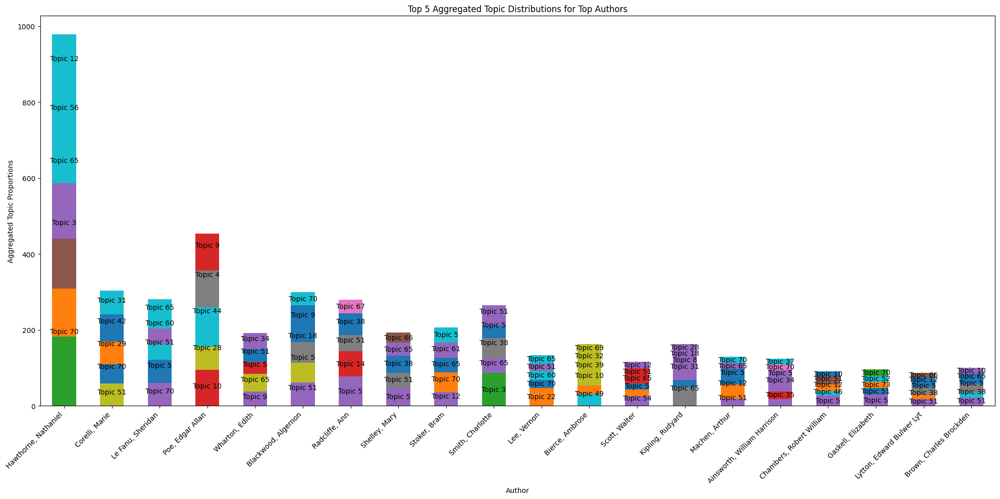

In [83]:
# Creating stacked bar charts with labels for the top 5 topics for Top Authors

plt.figure(figsize=(20, 10))


ax_top = filtered_data_top_authors.plot(kind='bar', stacked=True, figsize=(20, 10), legend=False)

# Adding labels within each bar for Top Authors
for i, author in enumerate(top_authors):
    cum_value = 0
    for topic in top_5_topics_top_authors.loc[author]:
        value = filtered_data_top_authors.at[author, topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_top.text(i, cum_value + value/2, topic, ha='center', va='center')
            cum_value += value

# Adding labels and title for Top Authors
plt.title('Top 5 Aggregated Topic Distributions for Top Authors')
plt.xlabel('Author')
plt.ylabel('Aggregated Topic Proportions')
plt.xticks(rotation=45, ha='right')

# Display the plot for Top Authors
plt.tight_layout()
plt.show()


<Figure size 2000x1000 with 0 Axes>

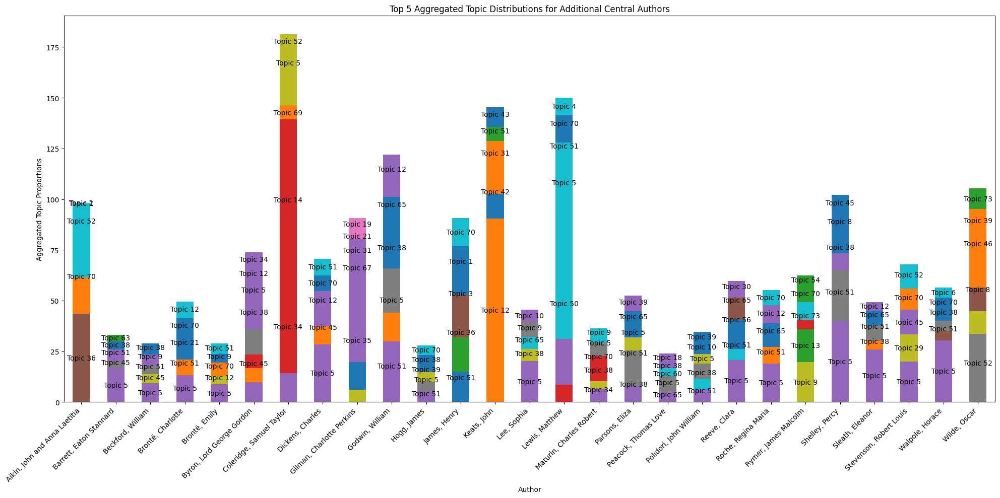

In [86]:
plt.figure(figsize=(20, 10))

# Plotting the stacked bar chart for Central Authors
ax_refined_central = filtered_data_refined_central.plot(kind='bar', stacked=True, figsize=(20, 10), legend=False)

# Adding labels within each bar for Central Authors
for i, author in enumerate(refined_central_authors):
    cum_value = 0
    for topic in top_5_topics_refined_central.loc[author]:
        value = filtered_data_refined_central.at[author, topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_refined_central.text(i, cum_value + value/2, topic, ha='center', va='center')
            cum_value += value

# Adding labels and title
plt.title('Top 5 Aggregated Topic Distributions for Additional Central Authors')
plt.xlabel('Author')
plt.ylabel('Aggregated Topic Proportions')
plt.xticks(rotation=45, ha='right')

# Display the plot for Central Authors
plt.tight_layout()
plt.show()

#### The most prevalent topics among these authors throughout time

In [89]:
# Combining the topic distributions of both central and top authors
combined_topics = pd.concat([aggregated_topics_top_authors, aggregated_topics_refined_central])

# Determining the 10 most prevalent topics across the combined set
top_10_topics = combined_topics.sum().nlargest(10).index.tolist()

# Data Preparation for Time Series Analysis
# Aggregating occurrences of each of the 15 topics by year
time_series_data = df[df['author'].isin(top_authors + refined_central_authors)]

# Creating a DataFrame to store the yearly aggregated values for each topic
yearly_topic_aggregation = pd.DataFrame(index=time_series_data['date'].unique(), columns=top_10_topics)

# Aggregating the topics by year
for topic in top_10_topics:
    yearly_data = time_series_data.groupby('date')[topic].sum()
    yearly_topic_aggregation[topic] = yearly_data

# Sorting the index to ensure it's in chronological order
yearly_topic_aggregation.sort_index(inplace=True)

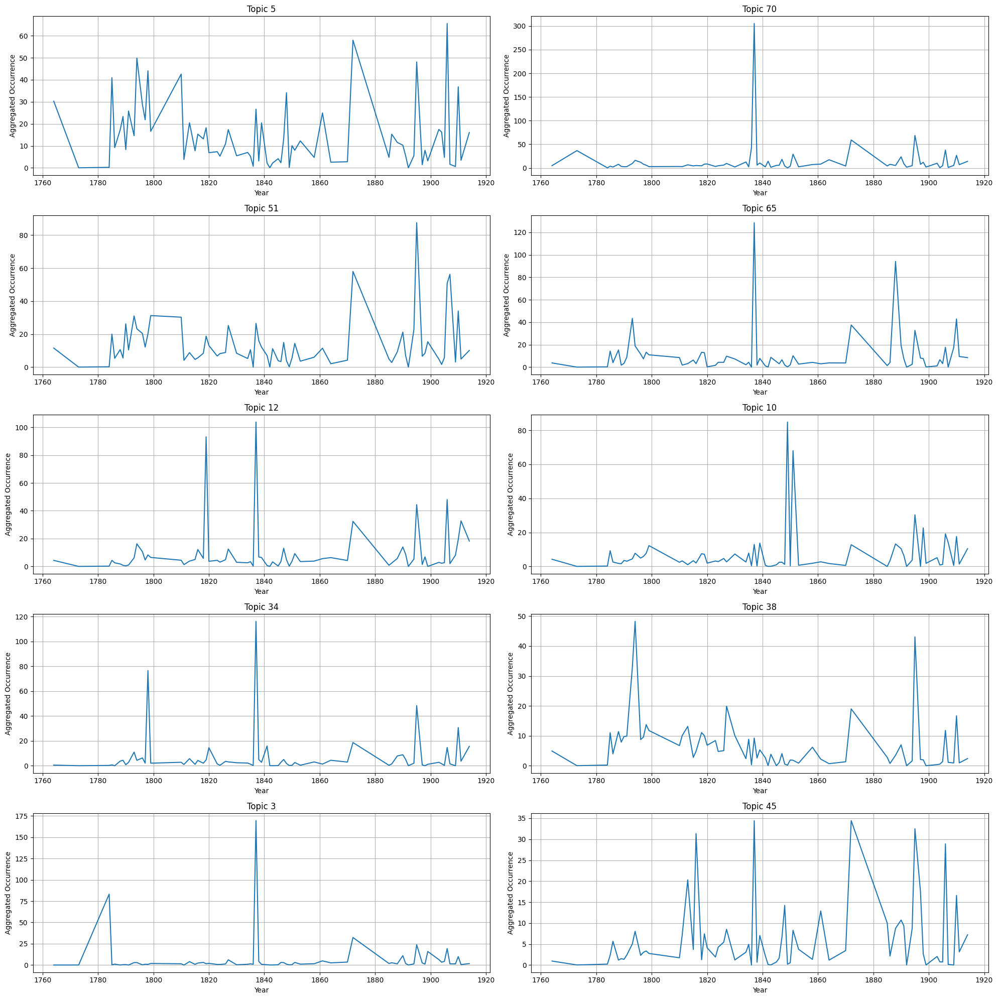

In [94]:
# Setting up the grid for facet wrap
plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(5, 2)  # 5 rows, 2 columns

# Creating individual plots for each of the top 10 topics
for i, topic in enumerate(top_10_topics):
    ax = plt.subplot(gs[i])
    ax.plot(yearly_topic_aggregation.index, yearly_topic_aggregation[topic])
    ax.set_title(topic)
    ax.set_xlabel('Year')
    ax.set_ylabel('Aggregated Occurrence')
    ax.grid(True)

# Adjusting layout for readability
plt.tight_layout()

plt.show()

Contribution of authors as well as individual works to the most distinct topics and most important topics according to the previous results, as well as the results of the pyLDAvis results of multidimensional scaling

In [99]:
relevant_topics = [f"Topic {i}" for i in range(1, 21)] + ["Topic 70", "Topic 65", "Topic 51", "Topic 45", "Topic 38", "Topic 34"]
relevant_topics = [topic for topic in relevant_topics if topic in df.columns]

# Aggregate data: Calculate the sum of contributions for each author in each topic
author_topic_contribution = df.groupby('author')[relevant_topics].sum()

# For each topic, find the top 5 contributing authors
top_authors_per_topic = {topic: author_topic_contribution[topic].nlargest(5) for topic in relevant_topics}

/tmp/ipykernel_8181/2988910888.py:21: UserWarning:

The figure layout has changed to tight



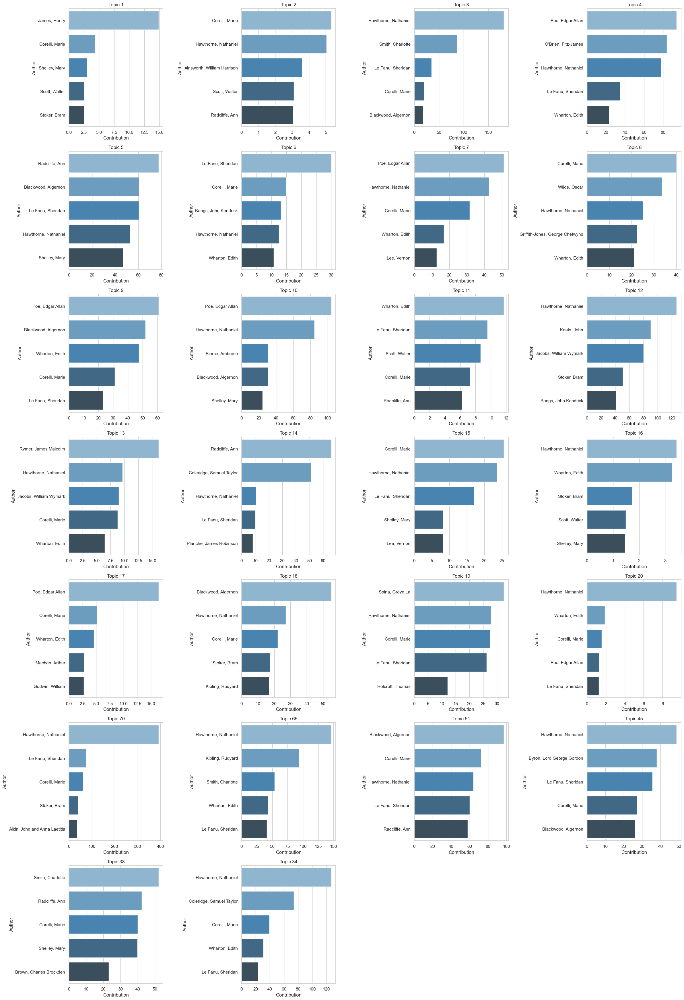

In [104]:
# Adjust the figure and subplots to accommodate all 26 topics (using a 7x4 grid)
fig, axes = plt.subplots(7, 4, figsize=(24, 35), constrained_layout=True)

# Flatten the array of axes for easy iteration
axes = axes.flatten()

for i, (topic, authors) in enumerate(top_authors_per_topic.items()):
    # Check to ensure we don't go out of bounds
    if i < len(axes):
        sns.barplot(ax=axes[i], x=authors.values, y=authors.index, palette="Blues_d", hue=authors.index, legend=False)
        axes[i].set_title(topic)
        axes[i].set_xlabel('Contribution')
        axes[i].set_ylabel('Author')

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)
    
plt.tight_layout()

plt.show()


#### The top texts per topic among the most prevalent topics

/tmp/ipykernel_8181/1377993473.py:26: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



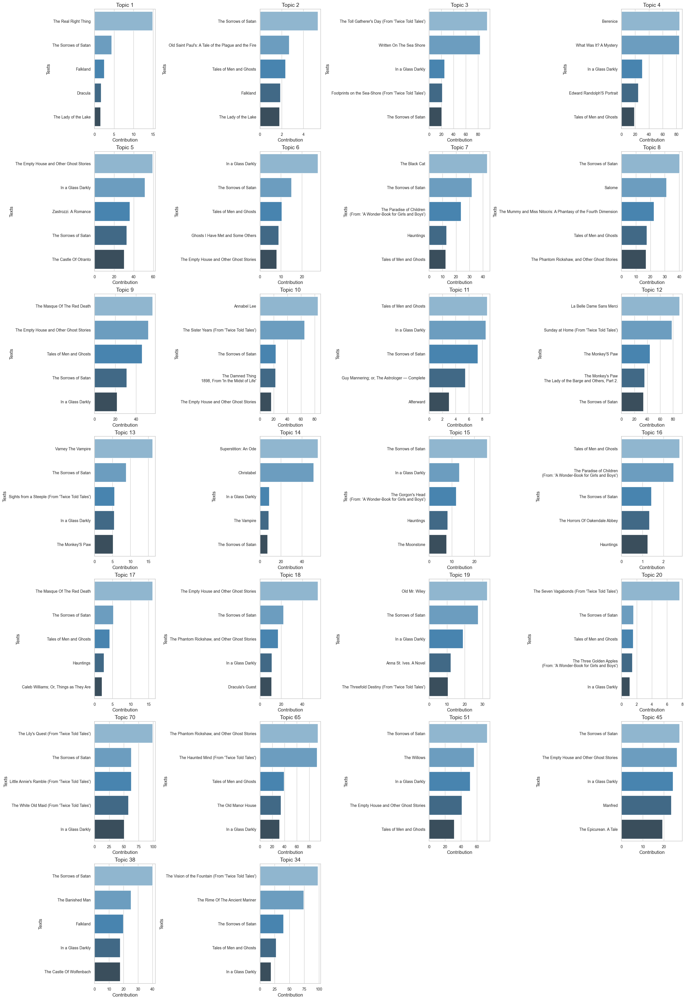

In [110]:
# Adjust the figure and subplots to accommodate all 26 topics (using a 7x4 grid)
fig, axes = plt.subplots(7, 4, figsize=(24, 35), constrained_layout=True)

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Setting font sizes for readability
title_fontsize = 14
label_fontsize = 12
tick_fontsize = 10

for i, (topic, titles) in enumerate(top_titles_per_topic.items()):
    # Check to ensure we don't go out of bounds
    if i < len(axes):
        sns.barplot(ax=axes[i], x=titles.values, y=titles.index, palette="Blues_d", hue=titles.index, legend=False)
        axes[i].set_title(topic, fontsize=title_fontsize)
        axes[i].set_xlabel('Contribution', fontsize=label_fontsize)
        axes[i].set_ylabel('Texts', fontsize=label_fontsize)
        axes[i].tick_params(labelsize=tick_fontsize)

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Adjusting the layout with better spacing
plt.subplots_adjust(hspace=0.4, wspace=0.3)

plt.show()

#### Gender-Based Analysis

Negative scores for 'f' gender topics indicate that these topics have a lesser distinct association with the 'f' gender compared to their association with the 'm' gender. Positive scores for 'm' gender topics reflect a stronger distinct association with the 'm' gender. This approach focuses on enhancing the distinctiveness of each gender for specific topics, revealing topics where one gender's contribution is relatively more significant than the other's.

This distinctiveness score will be the ratio of the specific contribution of the gender to the total contribution, subtracted from the contribution of all others. A higher score indicates greater distinctiveness. It aims to represents the degree to which a topic is associated with one gender while minimizing the contribution of the other. 

#### Contribution among the leading topics:

In [116]:
# Calculate the total contribution for each topic
total_contributions = df[relevant_topics].sum()

# Calculate specific contributions for genders
specific_contributions = df.groupby('gender')[relevant_topics].sum()

# Calculate distinctiveness score: specific contribution divided by total contribution
distinctiveness_scores = specific_contributions.div(total_contributions)

# Subtracting the sum of contributions of other genders to enhance distinctiveness
for gender in distinctiveness_scores.index:
    other_genders = distinctiveness_scores.index.difference([gender])
    distinctiveness_scores.loc[gender] -= distinctiveness_scores.loc[other_genders].sum()

# Identifying top 5 distinct topics for each gender
top_distinct_topics = {gender: distinctiveness_scores.loc[gender].nlargest(5) for gender in distinctiveness_scores.index}

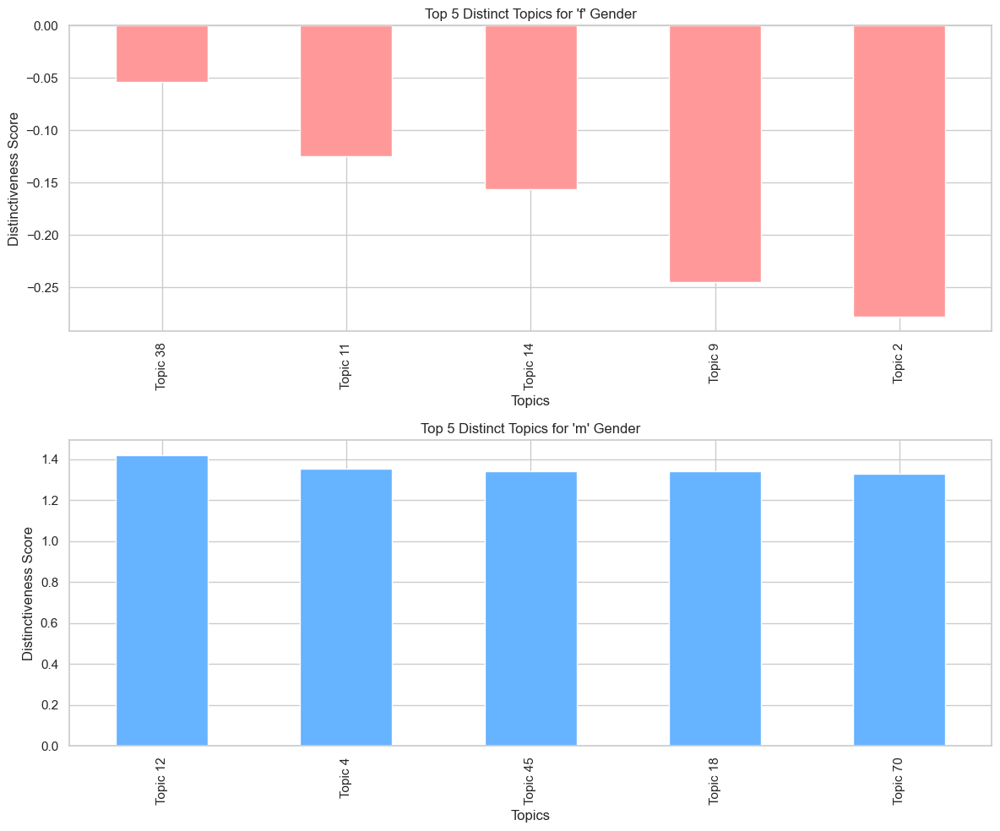

In [117]:
# Extracting the top 5 distinct topics for 'f' and 'm' genders
top_f_topics = top_distinct_topics['f']
top_m_topics = top_distinct_topics['m']

# Creating bar charts for each gender
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Top 5 distinct topics for 'f' gender
top_f_topics.plot(kind='bar', ax=axes[0], color='#ff9999')
axes[0].set_title("Top 5 Distinct Topics for 'f' Gender")
axes[0].set_ylabel("Distinctiveness Score")
axes[0].set_xlabel("Topics")

# Top 5 distinct topics for 'm' gender
top_m_topics.plot(kind='bar', ax=axes[1], color='#66b3ff')
axes[1].set_title("Top 5 Distinct Topics for 'm' Gender")
axes[1].set_ylabel("Distinctiveness Score")
axes[1].set_xlabel("Topics")

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

Notably, the scores are negative, indicating these topics are less distinctly associated with the 'f' gender compared to their association with the 'm' gender. The magnitude of the negative value represents the degree of this lesser association.

#### Contribution among all topics

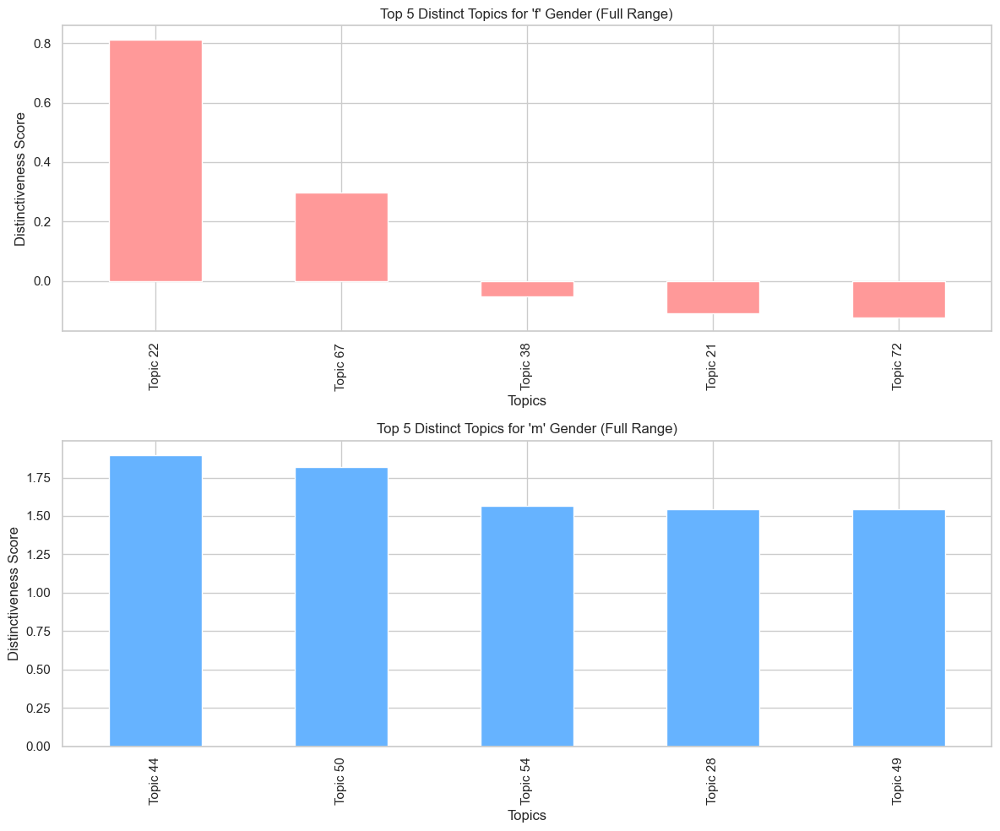

In [118]:
all_topics = [col for col in df.columns if col.startswith('Topic ')]

# Calculate the total contribution for each topic
total_contributions_all_topics = df[all_topics].sum()

# Calculate specific contributions for each gender for all topics
specific_contributions_all_topics = df.groupby('gender')[all_topics].sum()

# Calculate distinctiveness score for all topics
distinctiveness_scores_all_topics = specific_contributions_all_topics.div(total_contributions_all_topics)

# Subtracting the sum of contributions of other genders to enhance distinctiveness
for gender in distinctiveness_scores_all_topics.index:
    other_genders = distinctiveness_scores_all_topics.index.difference([gender])
    distinctiveness_scores_all_topics.loc[gender] -= distinctiveness_scores_all_topics.loc[other_genders].sum()

# Identifying top 5 distinct topics for each gender for all topics
top_distinct_topics_all_topics = {gender: distinctiveness_scores_all_topics.loc[gender].nlargest(5) for gender in distinctiveness_scores_all_topics.index}

# Extracting the top 5 distinct topics for 'f' and 'm' genders from the full topic range
top_f_topics_all = top_distinct_topics_all_topics['f']
top_m_topics_all = top_distinct_topics_all_topics['m']

# Creating bar charts for each gender
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Top 5 distinct topics for 'f' gender (full topic range)
top_f_topics_all.plot(kind='bar', ax=axes[0], color='#ff9999')
axes[0].set_title("Top 5 Distinct Topics for 'f' Gender (Full Range)")
axes[0].set_ylabel("Distinctiveness Score")
axes[0].set_xlabel("Topics")

# Top 5 distinct topics for 'm' gender (full topic range)
top_m_topics_all.plot(kind='bar', ax=axes[1], color='#66b3ff')
axes[1].set_title("Top 5 Distinct Topics for 'm' Gender (Full Range)")
axes[1].set_ylabel("Distinctiveness Score")
axes[1].set_xlabel("Topics")

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [123]:
# Selecting the top distinct topics for each gender from the full topic range
top_f_topics_list = top_f_topics_all.index.tolist()
top_m_topics_list = top_m_topics_all.index.tolist()

# Function to find the texts with the highest contribution to a given topic
def find_representative_texts(topic, num_texts=3):
    return df.sort_values(by=topic, ascending=False)[['title', 'author', topic]].head(num_texts)

# Finding representative texts for each of the top topics
representative_texts_f = {topic: find_representative_texts(topic) for topic in top_f_topics_list}
representative_texts_m = {topic: find_representative_texts(topic) for topic in top_m_topics_list}

condensed_representative_texts = {
    "f_gender": {topic: texts[['title', 'author']].to_dict(orient='records') for topic, texts in representative_texts_f.items()},
    "m_gender": {topic: texts[['title', 'author']].to_dict(orient='records') for topic, texts in representative_texts_m.items()}
}

condensed_representative_texts

{'f_gender': {'Topic 22': [{'title': 'Hauntings', 'author': 'Lee, Vernon'},
   {'title': 'Hauntings', 'author': 'Lee, Vernon'},
   {'title': 'Arthur Mervyn; Or, Memoirs Of The Year 1793',
    'author': 'Brown, Charles Brockden'}],
  'Topic 67': [{'title': 'Superstition: An Ode', 'author': 'Radcliffe, Ann'},
   {'title': 'The Yellow Wallpaper', 'author': 'Gilman, Charlotte Perkins'},
   {'title': "The Damned Thing\n1898, From 'In the Midst of Life'",
    'author': 'Bierce, Ambrose'}],
  'Topic 38': [{'title': 'The Banished Man', 'author': 'Smith, Charlotte'},
   {'title': 'The Castle Of Wolfenbach', 'author': 'Parsons, Eliza'},
   {'title': 'The Emigrants', 'author': 'Smith, Charlotte'}],
  'Topic 21': [{'title': 'Villette', 'author': 'Brontë, Charlotte'},
   {'title': 'The Yellow Wallpaper', 'author': 'Gilman, Charlotte Perkins'},
   {'title': 'The Grey Woman', 'author': 'Gaskell, Elizabeth'}],
  'Topic 72': [{'title': 'A Beleaguered City, Being A Narrative Of Certain Recent Events In 

#### Nationality-Based Analysis

Just as for gender, we will for each topic, calculate a distinctiveness score for each nationality, focusing on minimizing the contribution of other nationalities.

In [130]:
# Calculate the total contribution for each topic
total_contributions_nationality = df[all_topics].sum()

# Calculate specific contributions for each nationality for all topics
specific_contributions_nationality = df.groupby('nationality')[all_topics].sum()

# Calculate distinctiveness score for all topics for each nationality
distinctiveness_scores_nationality = specific_contributions_nationality.div(total_contributions_nationality)

# Subtracting the sum of contributions of all other nationalities to enhance distinctiveness
for nationality in distinctiveness_scores_nationality.index:
    other_nationalities = distinctiveness_scores_nationality.index.difference([nationality])
    distinctiveness_scores_nationality.loc[nationality] -= distinctiveness_scores_nationality.loc[other_nationalities].sum()

# Identifying top 5 distinct topics for each nationality for all topics
top_distinct_topics_nationality = {nationality: distinctiveness_scores_nationality.loc[nationality].nlargest(5) for nationality in distinctiveness_scores_nationality.index}


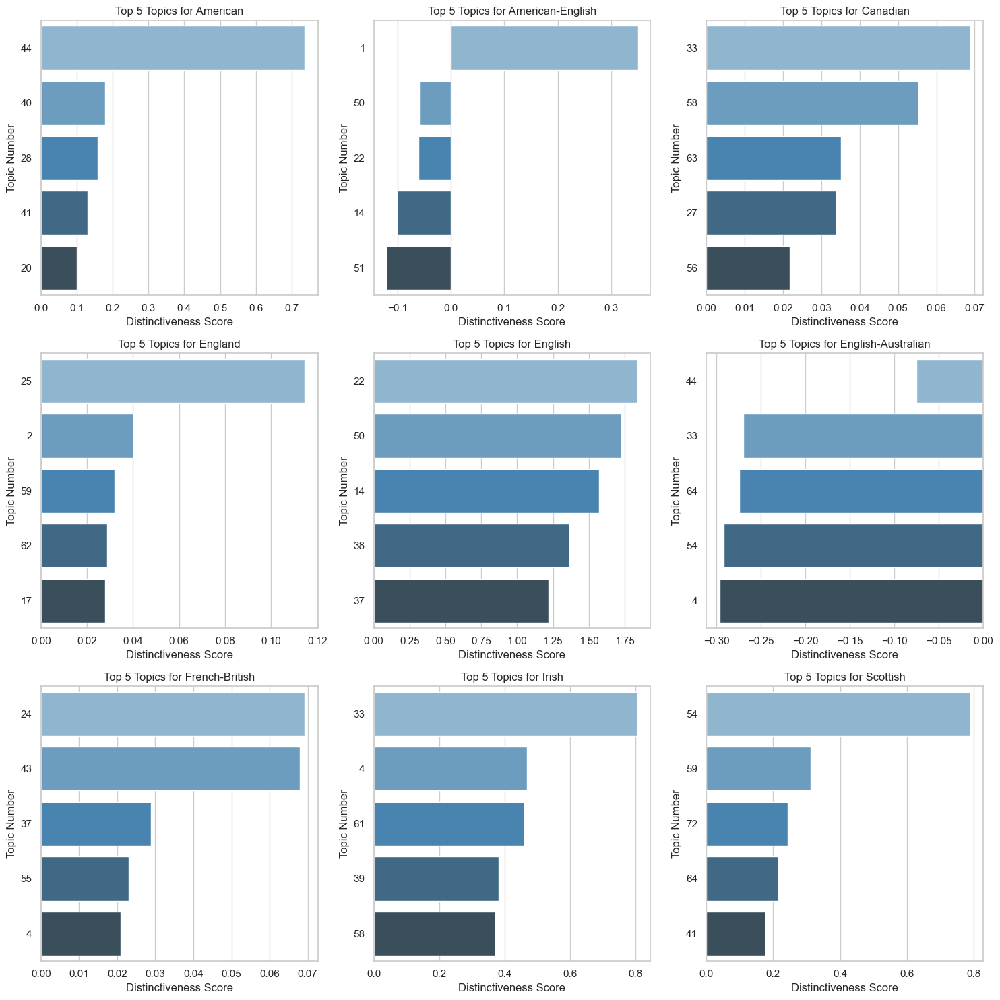

In [131]:
selected_nationalities = list(top_distinct_topics_nationality.keys())[:9]

# Creating subplots in a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flattening the axes array for easier iteration
axes = axes.flatten()

# Plotting the distinctiveness scores for each selected nationality
for i, nationality in enumerate(selected_nationalities):
    topics_data = top_distinct_topics_nationality[nationality].head(num_topics).reset_index()
    topics_data.columns = ['Topic', 'Distinctiveness Score']
    topics_data['Topic Number'] = topics_data['Topic'].str.extract(r'(\d+)')
    sns.barplot(x='Distinctiveness Score', y='Topic Number', data=topics_data, ax=axes[i], palette="Blues_d", hue='Topic Number', legend=False)
    axes[i].set_title(f'Top 5 Topics for {nationality}')
    axes[i].set_xlabel('Distinctiveness Score')
    axes[i].set_ylabel('Topic Number')

# Adjusting layout
plt.tight_layout()

# Show the plots
plt.show()

In [132]:
# Function to find the texts with the highest contribution to a given topic for each nationality
def find_representative_texts_nationality(topics, num_texts=3):
    representative_texts = {}
    for nationality, topics_scores in topics.items():
        representative_texts[nationality] = {}
        for topic in topics_scores.index:
            top_texts = df.sort_values(by=topic, ascending=False)[['title', 'author', topic]].head(num_texts)
            representative_texts[nationality][topic] = top_texts.to_dict(orient='records')
    return representative_texts

# Finding representative texts for each of the top topics of each nationality
representative_texts_nationality = find_representative_texts_nationality(top_distinct_topics_nationality)

representative_texts_nationality

{'American': {'Topic 44': [{'title': 'The Tell-Tale Heart',
    'author': 'Poe, Edgar Allan',
    'Topic 44': 94.58},
   {'title': 'In Search of the Unknown',
    'author': 'Chambers, Robert William',
    'Topic 44': 1.64},
   {'title': 'The Narrative Of Arthur Gordon Pym Of Nantucket',
    'author': 'Poe, Edgar Allan',
    'Topic 44': 1.55}],
  'Topic 40': [{'title': "Fancy's Show-Box (From 'Twice Told Tales')",
    'author': 'Hawthorne, Nathaniel',
    'Topic 40': 50.5},
   {'title': 'The Italian, Or, The Confessional Of The Black Penitents. A Romance',
    'author': 'Radcliffe, Ann',
    'Topic 40': 5.33},
   {'title': "Snow Flakes (From 'Twice Told Tales')",
    'author': 'Hawthorne, Nathaniel',
    'Topic 40': 2.66}],
  'Topic 28': [{'title': 'The Oval Portrait',
    'author': 'Poe, Edgar Allan',
    'Topic 28': 96.28},
   {'title': 'The Phantom Rickshaw, and Other Ghost Stories',
    'author': 'Kipling, Rudyard',
    'Topic 28': 14.09},
   {'title': 'In Search of the Unknown',
  

#### Connection between sentiment and different topics:

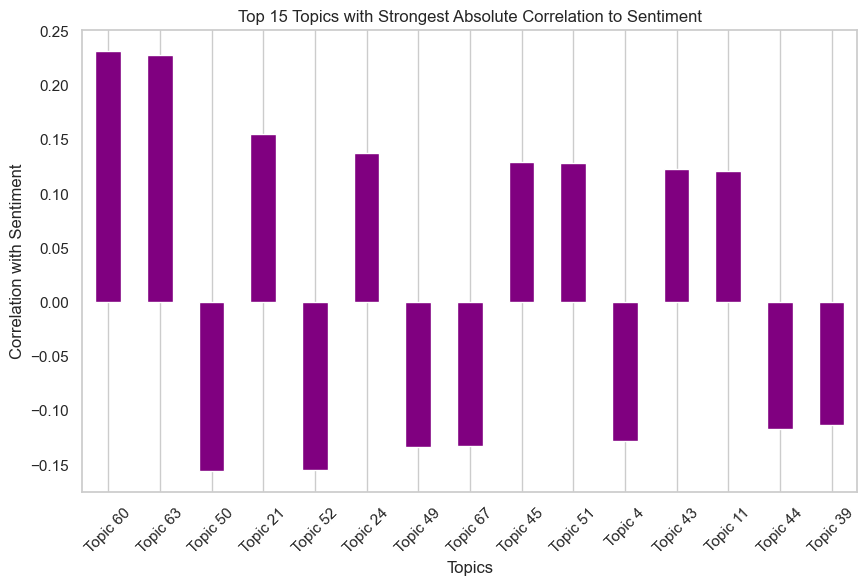

In [136]:
all_topics_sentiment_correlations = df[all_topics + ['sentiment']].corr()['sentiment'].drop('sentiment')

# Selecting the 15 topics with the strongest correlation (both positive and negative)
strongest_correlations = all_topics_sentiment_correlations.abs().nlargest(15)
selected_strongest_topics = strongest_correlations.index.tolist()

# Selecting the 15 topics with the strongest absolute correlation (considering both positive and negative)
strongest_absolute_correlations = all_topics_sentiment_correlations.abs().nlargest(15)
selected_strongest_absolute_topics = strongest_absolute_correlations.index.tolist()

# Visualization of the correlation for these 15 topics
plt.figure(figsize=(10, 6))
all_topics_sentiment_correlations[selected_strongest_absolute_topics].plot(kind='bar', color='purple')
plt.title('Top 15 Topics with Strongest Absolute Correlation to Sentiment')
plt.xlabel('Topics')
plt.ylabel('Correlation with Sentiment')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show the plot
plt.show()

The correlation with sentiment is not overly strong, but still given for some topics

#### Network Analysis:

Calculate Similarity: Compute pairwise similarity between documents based on topic distributions. This can be done using cosine similarity.

Create a Network Graph:Nodes will represent the documents. Edges will represent the similarity between documents, potentially with a threshold to filter out low-similarity connections.

Network Analysis:Analyze the network to find clusters of similar texts, centrality measures, and other network characteristics.

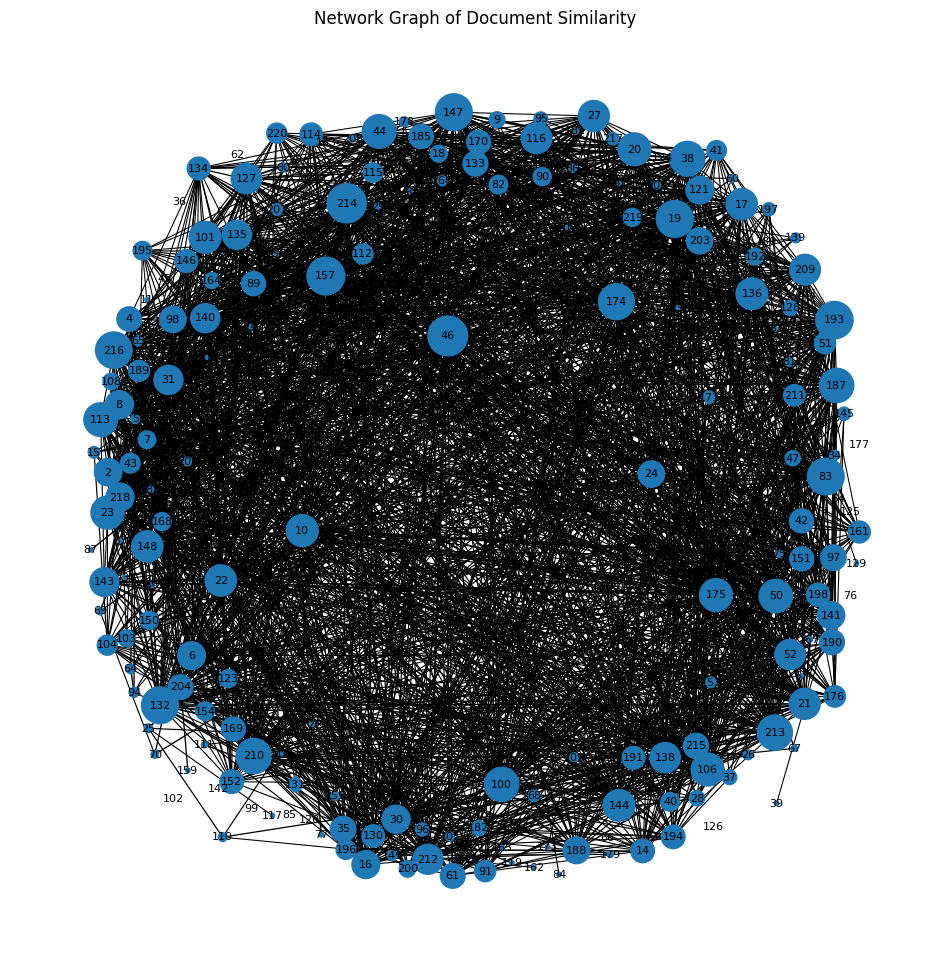

In [47]:
# Calculate cosine similarities based on the topic distributions
# This will create a matrix of similarities between all pairs of documents
similarity_matrix = cosine_similarity(df[topic_columns])

# Since the similarity matrix is symmetric, we'll fill the upper triangle with np.nan to avoid duplicate edges
np.fill_diagonal(similarity_matrix, np.nan)

# Define a similarity threshold
similarity_threshold = 0.75  # 20% similarity

# Step 5: Create Graph
# Initialize an undirected graph
G = nx.Graph()

# Add nodes to the graph
for idx, row in df.iterrows():
    G.add_node(idx, title=row['title'], author=row['author'], date=row['date'])

# Add edges based on the similarity threshold
# The edge weight will be based on the degree of similarity
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i][j] >= similarity_threshold:
            G.add_edge(i, j, weight=similarity_matrix[i][j])

number_of_nodes = G.number_of_nodes()
number_of_edges = G.number_of_edges()


# Set up the figure size and layout
plt.figure(figsize=(12,12))

# Draw the network graph with node size proportional to the degree of the node
# and edge width proportional to the weight of the edge
pos = nx.spring_layout(G, k=1.75, iterations=20)  # positions for all nodes

# nodes
node_sizes = [10 * nx.degree(G, n) for n in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes)

# edges
edges = G.edges()
weights = [G[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights)

# labels
nx.draw_networkx_labels(G, pos, font_size=8)

# display the graph
plt.title("Network Graph of Document Similarity")
plt.axis('off')  # Turn off the axis
plt.show()

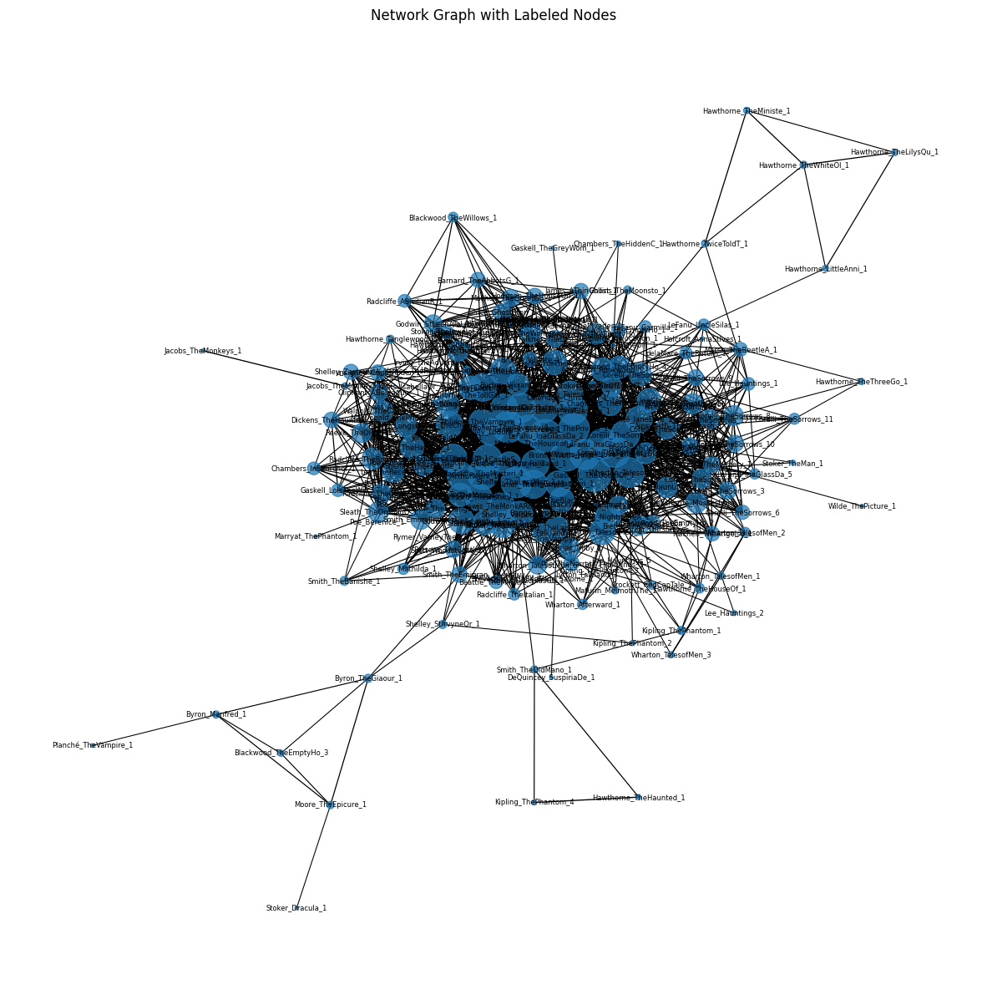

In [18]:
# Adjust the visualization to include labels based on the 'reference' column
# and use a layout that spreads the nodes more outward.

# Use the 'reference' column from the dataframe as labels
if 'reference' in df.columns:
    labels = df['reference'].to_dict()
else:
    labels = {i: f'Doc {i}' for i in range(len(df))} 

# Use the Kamada-Kawai layout for a more spread out layout
pos = nx.kamada_kawai_layout(G)

# Now we'll draw the graph with the new positions and labels
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights)
nx.draw_networkx_labels(G, pos, labels=labels, font_size=6)

plt.title("Network Graph with Labeled Nodes")
plt.axis('off')  # Turn off the axis
plt.show()


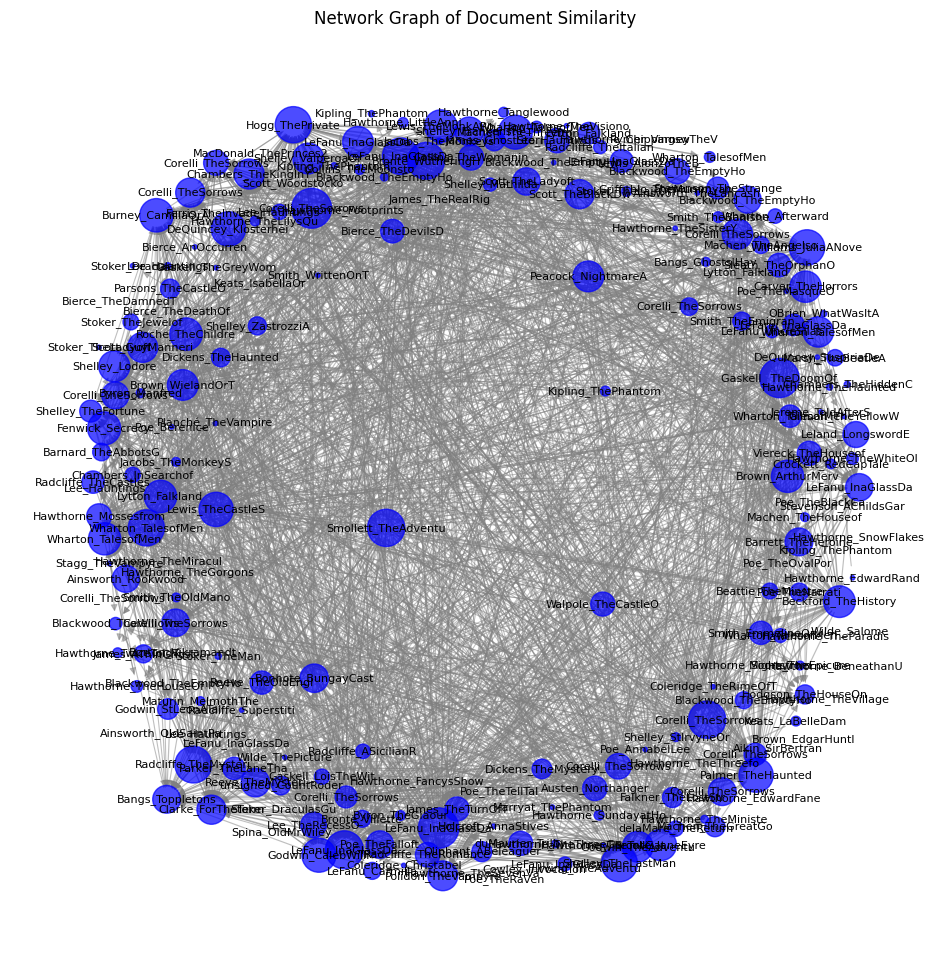

(222, 2241)

In [49]:
topic_columns = [col for col in df.columns if col.startswith('Topic')]
date_column = 'date'

# Calculate cosine similarities based on the topic distributions
similarity_matrix = cosine_similarity(df[topic_columns])

# Since the similarity matrix is symmetric, we'll fill the upper triangle with np.nan to avoid duplicate edges
np.fill_diagonal(similarity_matrix, np.nan)

# Define a similarity threshold
similarity_threshold = 0.75  # Adjusted for stronger connections

# Initialize an undirected graph
G = nx.DiGraph()

# Add nodes to the graph
for idx, row in df.iterrows():
    G.add_node(idx, text_key=row['text_key'], date=row['date'])

# Add edges based on the similarity threshold and date comparison
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if not np.isnan(similarity_matrix[i][j]) and similarity_matrix[i][j] >= similarity_threshold:
            # Check the date to establish edge direction
            if df.iloc[i][date_column] < df.iloc[j][date_column]:
                G.add_edge(i, j, weight=similarity_matrix[i][j])
            elif df.iloc[i][date_column] > df.iloc[j][date_column]:
                G.add_edge(j, i, weight=similarity_matrix[i][j])
            elif df.iloc[i][date_column] == df.iloc[j][date_column]:
                G.add_edge(i, j, weight=similarity_matrix[i][j])
                G.add_edge(j, i, weight=similarity_matrix[i][j])

# Set up the figure size and layout
plt.figure(figsize=(12,12))

# Draw the network graph with node size proportional to the degree of the node
# and edge width proportional to the weight of the edge
pos = nx.spring_layout(G, k=1.75, iterations=20)  # positions for all nodes

# Nodes
node_sizes = [10 * G.degree(n) for n in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='blue', alpha=0.7)

# Edges
edges = G.edges()
weights = [G[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, alpha=0.5, edge_color='gray')

# Labels
labels = {i: f"{df.iloc[i]['text_key']}" for i in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, font_color='black')

# Display the graph
plt.title("Network Graph of Document Similarity")
plt.axis('off')  # Turn off the axis
plt.show()

# Print the number of nodes and edges
number_of_nodes = G.number_of_nodes()
number_of_edges = G.number_of_edges()

number_of_nodes, number_of_edges

In [ ]:

# Function to get the top N topic columns for each row
def get_top_n_topics(row, n=5):
    return row.nlargest(n).index.tolist()

# Apply the function to each row of the topic columns and get a list of top 5 topic columns for each segment
top_n_topics = df[topic_columns].apply(lambda row: get_top_n_topics(row, n=5), axis=1)

# Create an empty similarity matrix with NaN values
similarity_matrix = np.full((df.shape[0], df.shape[0]), np.nan)

# Calculate the similarity based on the top N topics for each document
for i in range(df.shape[0]):
    for j in range(i+1, df.shape[0]):
        # Intersection gives the common top topics between document i and j
        common_topics = set(top_topic_columns.iloc[i]).intersection(set(top_topic_columns.iloc[j]))
        if common_topics:
            # Calculate similarity only based on the common top topics
            similarity = cosine_similarity([df.loc[i, common_topics]], [df.loc[j, common_topics]])[0, 0]
            similarity_matrix[i, j] = similarity
            similarity_matrix[j, i] = similarity  # Symmetric matrix

# Define a similarity threshold
similarity_threshold = 0.75  # Adjusted for stronger connections

# Initialize a directed graph
G = nx.DiGraph()

# Add nodes to the graph with text_key as node labels
for idx, row in df.iterrows():
    G.add_node(idx, label=row['text_key'], date=row['date'])

# Add edges based on the similarity threshold and date comparison
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        # Only consider similarity above the threshold
        if not np.isnan(similarity_matrix[i, j]) and similarity_matrix[i, j] >= similarity_threshold:
            # Add an edge if one text is older than the other
            if df.iloc[i]['date'] < df.iloc[j]['date']:
                G.add_edge(df.iloc[i]['text_key'], df.iloc[j]['text_key'], weight=similarity_matrix[i, j])
            elif df.iloc[i]['date'] > df.iloc[j]['date']:
                G.add_edge(df.iloc[j]['text_key'], df.iloc[i]['text_key'], weight=similarity_matrix[i, j])
            # If they are from the same year, add edges in both directions
            elif df.iloc[i]['date'] == df.iloc[j]['date']:
                G.add_edge(df.iloc[i]['text_key'], df.iloc[j]['text_key'], weight=similarity_matrix[i, j])
                G.add_edge(df.iloc[j]['text_key'], df.iloc[i]['text_key'], weight=similarity_matrix[i, j])

# Visualization
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, k=0.15, iterations=20)  # positions for all nodes
nx.draw(G, pos, with_labels=True, node_size=500, node_color='skyblue', node_shape='o', alpha=0.5,
        linewidths=4, font_size=15, font_weight='bold', width=2, edge_color='grey')
plt.title('Directed Network Graph based on Text Similarity')
plt.show()

# Output the number of nodes and edges in the graph
number_of_nodes = G.number_of_nodes()
number_of_edges = G.number_of_edges()

(number_of_nodes, number_of_edges)

Nodes are not rows in the df, but unique text key entries and edges are the presence of a t least one row per text key that shares with at least one row of the other text key a similarity higher than the threshhold, while the weights are the amount of rows sharing this connection. The size of each node is determined by the node's degree (the number of connections it has). This is calculated using nx.degree(G, n) for each node n in the graph G.

Connection mindestens ein verbindenes Glied - Weight: Anzahl der verbunenen glieder

Unilaterale Verbindungen vom älteren zum jüngeren,  bilateral wenn gleich

Aggregation oder Vergleich der jeweils 2ten/3ten/4ten usw. Segmente miteinander, um Composition zu erkennen 

Vergleich der Topic Shape der Modelle miteinander, um das historische Pattern besser erkennen zu können.

how a certain closeness in the distribution of topics can be interpreted as a literary influence  unilateraly through out time.

check out the papers:
distributed character, the location of literary history, close and distant reading modernism and visualization in stylometry

Adjust the results to use more relative terms, averaged for all of their texts

Additional topic visualizations:
Topic Uniqueness: For each topic, identify words that are unique or particularly frequent compared to other topics. 

Word Relevance: Assess the relevance of each word in a topic. How much a word contributes to the coherence of a topic. LDA measures like 'lift' and 'relevance' signfy this.
Create word clouds for each topic, where the size of each word represents its frequency or relevance.

Dataframe consisting of a document topic distribution with each document being one 1000-word segment of a book and the features about the texts covering the following attributes: 'title', 'author', 'date','gender', 'birthdate', 'nationality', 'source', 'polarity' always being given, as well as the following only filled for about 1/4 of the texts 'period', 'mode', 'genre',  'role (central/peripheral/influence)' and 'polarity',

Literary Movement:

Investigate if there are patterns in topic distributions based on the author's nationality or associated literary periods ('period' column). This might require grouping the data by these attributes and then visualizing the average topic distributions for each group.

Clustering Analysis:

Use clustering techniques (like K-means or hierarchical clustering) on the topic distributions to group similar text segments. This can be visualized in a scatter plot using a dimensionality reduction technique (like PCA)

Correlation Heatmaps:

Create heatmaps to visualize the correlation between different topics and textual features. This can help identify which topics are strongly associated with specific attributes like genre, period, or author attributes.

#### CTM

In [33]:
prepared_data = pyLDAvis.prepare(topic_term_dists_ETM, doc_topic_dists_ETM, doc_lengths, vocab, term_frequency)

# Display the visualization
pyLDAvis.display(prepared_data)

#### ETM

In [96]:
prepared_data = pyLDAvis.prepare(topic_term_dists_ETM, doc_topic_dists_ETM, doc_lengths, vocab, term_frequency)

# Display the visualization
pyLDAvis.display(prepared_data)

In [ ]:
# Function to convert year to decade
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_time['decade'] = df_time['date'].apply(year_to_decade)

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped = df_time.groupby('decade')[topic_columns].mean()

plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in topic_columns:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [ ]:
plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in fluctuating_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [8]:
df_ETM = df_txt_features_ETM.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_ETM['decade'] = df_ETM['date'].apply(year_to_decade)

# Extracting topic columns
topic_columns_ETM= [col for col in df_ETM.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_ETM= df_ETM.groupby('decade')[topic_columns_ETM].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_ETM.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_ETM.index, y=decade_grouped_ETM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig


# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_ETM.index, y=decade_grouped_ETM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])


# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)